# Lab assignment №1, part 2

This lab assignment consists of several parts. You are supposed to make some transformations, train some models, estimate the quality of the models and explain your results.

Several comments:
* Don't hesitate to ask questions, it's a good practice.
* No private/public sharing, please. The copied assignments will be graded with 0 points.
* Blocks of this lab will be graded separately.

__*This is the second part of the assignment. First and third parts are waiting for you in the same directory.*__

## Part 2. Data preprocessing, model training and evaluation.

### 1. Reading the data
Today we work with the [dataset](https://archive.ics.uci.edu/ml/datasets/Statlog+%28Vehicle+Silhouettes%29), describing different cars for multiclass ($k=4$) classification problem. The data is available below.

In [1]:
# If on colab, uncomment the following lines

# ! wget https://raw.githubusercontent.com/girafe-ai/ml-course/22f_made/homeworks/lab01_ml_pipeline/car_data.csv

In [1]:
import pandas as pd
import numpy as np
import json 
import re
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFECV
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from scikitplot.metrics import plot_roc
from sklearn.model_selection import train_test_split, GridSearchCV
from collections.abc import Iterable

dataset = pd.read_csv('car_data.csv', delimiter=',', header=None).values
data = dataset[:, :-1].astype(int)
target = dataset[:, -1]

print(data.shape, target.shape)

X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.35)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(846, 19) (846,)
(549, 19) (549,) (297, 19) (297,)


To get some insights about the dataset, `pandas` might be used. The `train` part is transformed to `pd.DataFrame` below.

In [2]:
X_train_pd = pd.DataFrame(X_train)

# First 15 rows of our dataset.
X_train_pd.head(15)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,355,93,42,88,188,62,10,183,36,21,141,208,504,168,70,3,12,189,197
1,396,108,57,106,177,51,5,256,26,28,170,285,966,261,87,11,2,182,181
2,251,104,58,103,230,69,11,219,30,25,176,231,716,246,71,7,4,187,196
3,246,95,36,73,191,73,6,156,41,19,126,184,374,124,71,2,19,199,204
4,413,88,36,78,160,62,6,140,48,18,123,161,287,129,66,4,35,194,202
5,474,82,40,73,141,57,8,153,44,19,133,173,342,153,75,11,9,181,187
6,461,106,52,107,211,62,8,200,33,23,161,218,602,200,67,9,17,194,201
7,130,100,46,104,184,60,9,197,34,23,147,222,578,198,73,13,13,189,197
8,329,89,38,80,169,59,7,161,41,20,131,186,389,137,68,5,15,192,197
9,159,91,45,75,154,57,6,150,44,19,146,170,335,180,66,16,2,193,198


Methods `describe` and `info` deliver some useful information.

In [3]:
X_train_pd.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
count,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000
mean,413.515483,93.360656,44.564663,81.695811,168.661202,61.872495,8.635701,167.921676,41.169399,20.508197,147.313297,188.207650,435.271403,173.540984,72.575592,6.284153,12.591985,188.819672,195.506375
std,242.950594,8.115790,6.240753,15.666005,33.773207,8.281440,4.975696,33.306080,7.805955,2.606566,14.526851,31.878829,177.198920,33.330471,7.808861,4.856268,8.785211,6.029603,7.297288
min,0.000000,77.000000,33.000000,40.000000,105.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,177.000000,181.000000
25%,198.000000,87.000000,39.000000,70.000000,141.000000,57.000000,7.000000,146.000000,34.000000,19.000000,135.000000,168.000000,317.000000,147.000000,67.000000,2.000000,5.000000,184.000000,191.000000
50%,414.000000,92.000000,44.000000,79.000000,165.000000,61.000000,8.000000,156.000000,43.000000,20.000000,145.000000,178.000000,362.000000,172.000000,71.000000,5.000000,11.000000,189.000000,197.000000
75%,620.000000,99.000000,49.000000,96.000000,195.000000,65.000000,10.000000,195.000000,46.000000,22.000000,158.000000,216.000000,574.000000,197.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,845.000000,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,186.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,40.000000,206.000000,211.000000


In [4]:
X_train_pd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 549 entries, 0 to 548
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   0       549 non-null    int32
 1   1       549 non-null    int32
 2   2       549 non-null    int32
 3   3       549 non-null    int32
 4   4       549 non-null    int32
 5   5       549 non-null    int32
 6   6       549 non-null    int32
 7   7       549 non-null    int32
 8   8       549 non-null    int32
 9   9       549 non-null    int32
 10  10      549 non-null    int32
 11  11      549 non-null    int32
 12  12      549 non-null    int32
 13  13      549 non-null    int32
 14  14      549 non-null    int32
 15  15      549 non-null    int32
 16  16      549 non-null    int32
 17  17      549 non-null    int32
 18  18      549 non-null    int32
dtypes: int32(19)
memory usage: 40.9 KB


### 2. Machine Learning pipeline
Here you are supposed to perform the desired transformations. Please, explain your results briefly after each task.

#### 2.0. Data preprocessing
* Make some transformations of the dataset (if necessary). Briefly explain the transformations

Lets load the column names to improve our understanding of what is going on.

In [5]:
COLUMNS_NAMES_FILE = "./column_names.json"
cf = open(COLUMNS_NAMES_FILE)
COLUMNS_NAMES = json.load(cf)
cf.close()
COLUMNS_NAMES

['COMPACTNESS',
 'CIRCULARITY',
 'DISTANCE CIRCULARITY',
 'RADIUS RATIO',
 'PRAXIS ASPECT RATIO',
 'MAXLENGTH ASPECT RATIO',
 'SCATTER RATIO',
 'ELONGATEDNESS',
 'PRAXIS RECTANGULARITY',
 'MAXLENGTH RECTANGULARITY',
 'SCALED VARIANCE ALONG MAJOR AXIS',
 'SCALED VARIANCE ALONG MINOR AXIS',
 'SCALED RADIUS OF GYRATION',
 'SKEWNESS ABOUT MAJOR AXIS',
 'SKEWNESS ABOUT MINOR AXIS',
 'KURTOSIS ABOUT MINOR AXIS',
 'KURTOSIS ABOUT MAJOR AXIS',
 'HOLLOWS RATIO',
 'CLASS LABEL']

In [6]:
COLUMNS_NAMES = [re.sub(" ", "_", i.lower()) for i in COLUMNS_NAMES]
COLUMNS_NAMES[-1] = "target"
COLUMNS_NAMES

['compactness',
 'circularity',
 'distance_circularity',
 'radius_ratio',
 'praxis_aspect_ratio',
 'maxlength_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'praxis_rectangularity',
 'maxlength_rectangularity',
 'scaled_variance_along_major_axis',
 'scaled_variance_along_minor_axis',
 'scaled_radius_of_gyration',
 'skewness_about_major_axis',
 'skewness_about_minor_axis',
 'kurtosis_about_minor_axis',
 'kurtosis_about_major_axis',
 'hollows_ratio',
 'target']

In [7]:
df = pd.DataFrame(data)
df["target"] = target
df.shape

(846, 20)

In [8]:
df.sample(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,target
663,663,89,47,83,169,61,8,164,40,20,150,189,402,190,72,7,10,187,193,saab
20,20,84,47,75,153,64,6,154,43,19,145,175,354,184,75,0,3,185,192,bus
816,816,90,48,85,157,64,11,161,43,20,167,175,375,186,74,3,16,185,195,van
761,761,115,51,100,201,60,12,196,34,23,162,207,573,184,62,22,1,198,208,saab
102,102,94,42,68,150,64,7,128,52,18,143,154,246,159,69,14,5,192,196,van


The first column (zero one) looks like a copy of indices. It will be better to drop it.

In [9]:
df = df.drop(columns=[0])
assert len(COLUMNS_NAMES) == len(df.columns)

In [10]:
df.columns = COLUMNS_NAMES
df.sample(5)

,compactness,circularity,distance_circularity,radius_ratio,praxis_aspect_ratio,maxlength_aspect_ratio,scatter_ratio,elongatedness,praxis_rectangularity,maxlength_rectangularity,scaled_variance_along_major_axis,scaled_variance_along_minor_axis,scaled_radius_of_gyration,skewness_about_major_axis,skewness_about_minor_axis,kurtosis_about_minor_axis,kurtosis_about_major_axis,hollows_ratio,target
680,95,46,76,162,66,11,162,42,20,155,175,381,172,74,8,4,184,193,van
451,94,37,74,169,59,7,162,41,20,133,178,394,130,63,6,6,198,204,opel
77,86,40,62,140,62,7,150,45,19,133,165,330,173,82,2,3,180,185,saab
359,100,49,96,206,63,9,186,35,22,156,202,519,176,62,3,5,197,205,opel
462,97,47,81,183,64,8,168,39,20,150,193,426,182,70,11,2,192,198,opel


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   compactness                       846 non-null    int32 
 1   circularity                       846 non-null    int32 
 2   distance_circularity              846 non-null    int32 
 3   radius_ratio                      846 non-null    int32 
 4   praxis_aspect_ratio               846 non-null    int32 
 5   maxlength_aspect_ratio            846 non-null    int32 
 6   scatter_ratio                     846 non-null    int32 
 7   elongatedness                     846 non-null    int32 
 8   praxis_rectangularity             846 non-null    int32 
 9   maxlength_rectangularity          846 non-null    int32 
 10  scaled_variance_along_major_axis  846 non-null    int32 
 11  scaled_variance_along_minor_axis  846 non-null    int32 
 12  scaled_radius_of_gyrat

To avoid any data leakage story we need to split the data before any research.

In [81]:
X_train_pd, X_test_pd, y_train_pd, y_test_pd = train_test_split(
                                        df[COLUMNS_NAMES[:-1]], 
                                        df["target"], test_size=0.35)
X_train_pd.shape, y_train_pd.shape

((549, 18), (549,))

In [82]:
X_test_pd.shape, y_test_pd.shape

((297, 18), (297,))

Lets look on distributions and correlations.

In [83]:
X_train_pd.sample(5)

,compactness,circularity,distance_circularity,radius_ratio,praxis_aspect_ratio,maxlength_aspect_ratio,scatter_ratio,elongatedness,praxis_rectangularity,maxlength_rectangularity,scaled_variance_along_major_axis,scaled_variance_along_minor_axis,scaled_radius_of_gyration,skewness_about_major_axis,skewness_about_minor_axis,kurtosis_about_minor_axis,kurtosis_about_major_axis,hollows_ratio
639,108,55,105,230,68,11,218,30,24,171,228,709,210,69,14,4,190,197
293,93,36,63,139,57,8,132,50,18,136,158,260,121,67,3,27,193,201
346,117,52,110,228,65,12,212,31,24,163,228,668,220,66,21,25,194,205
650,98,55,104,213,67,9,206,32,23,167,223,629,220,72,5,19,187,196
108,80,44,68,135,59,8,150,45,19,145,170,329,173,80,7,12,180,185


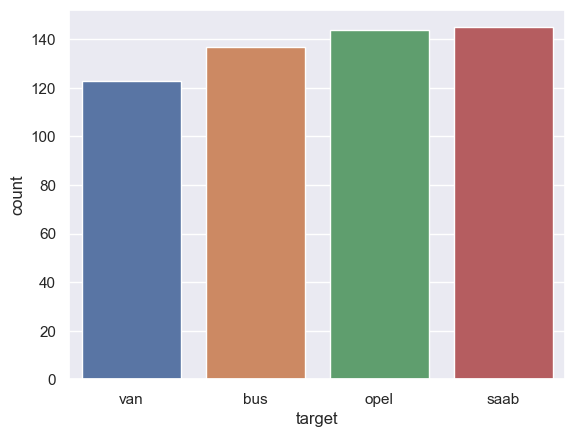

In [84]:
X_train_pd_labeled = X_train_pd.copy()
X_train_pd_labeled["target"] = y_train_pd
sns.countplot(X_train_pd_labeled, x="target")
plt.show()

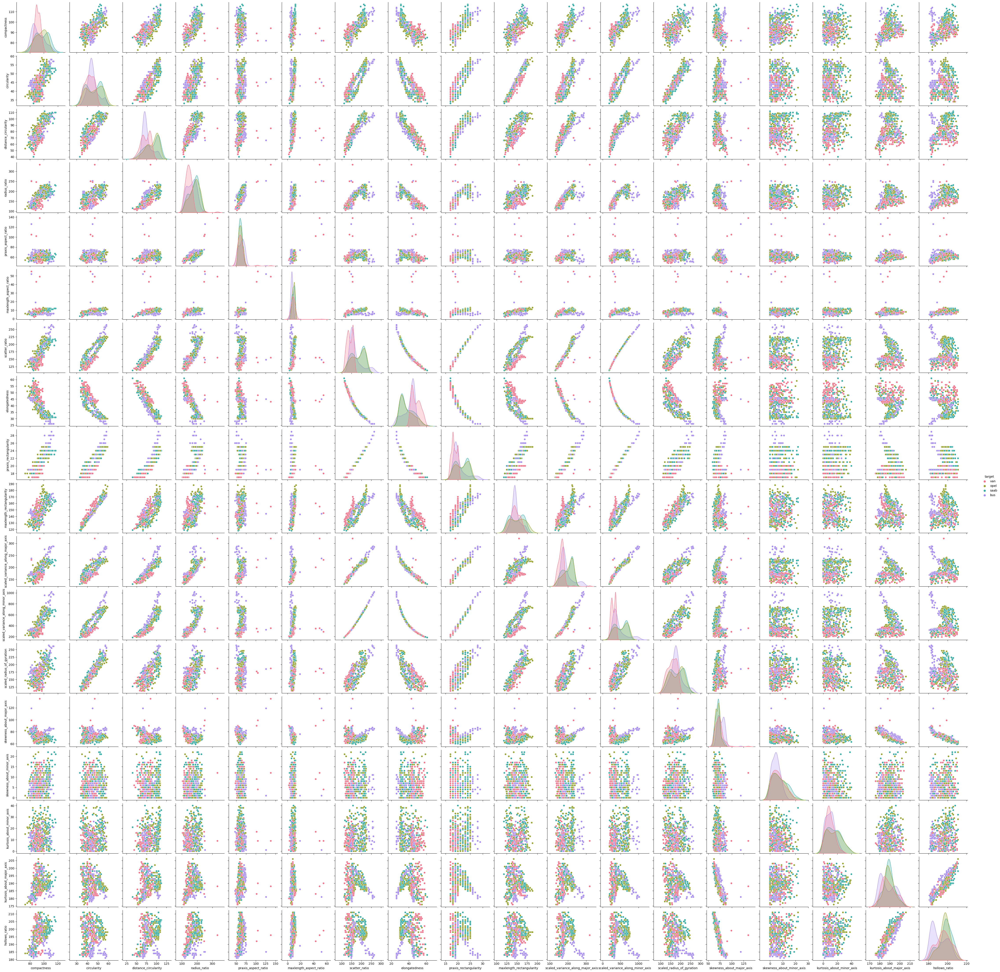

In [16]:
sns.pairplot(X_train_pd_labeled, diag_kind="kde", hue="target", palette="husl")
plt.show()

Inferences:

* ``praxis_aspect_ratio`` has similar distributions for ``opel`` and ``saab``. ``bus`` and ``van`` distributions look similar to each other either;
* ``praxis_rectangularity`` is same: for ``opel`` and ``saab`` it is similar distributions;
* The same can be said about ``scatter_ratio``, ``circularity``, ``elongatedness``, ``scaled_variance_along_major_axis``, ``scaled_variance_along_minor_axis``, ``scaled_variance_along_minor_axis``;
* Many columns have long tails indicating outliers;
* Many feature show that they highly correlated;


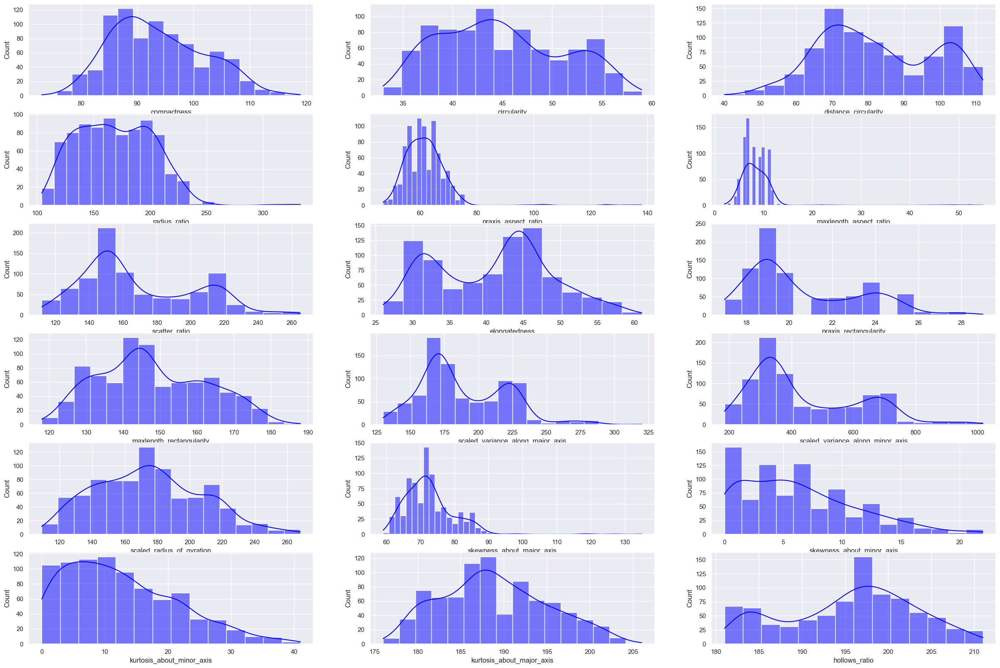

In [85]:
fig, ax = plt.subplots(6,3, figsize=(30,20))

for i in range(len(X_train_pd.columns)):
    sns.histplot(df[X_train_pd.columns[i]], kde=True, ax=ax[i//3, i%3], color="blue")

Inference:

Some of the features distributions looks similar, for example ``scatter_ratio``, ``paxis_rectangularity``, ``scaled_variance_along_minor_axis``

Let me drop the highly correlated features

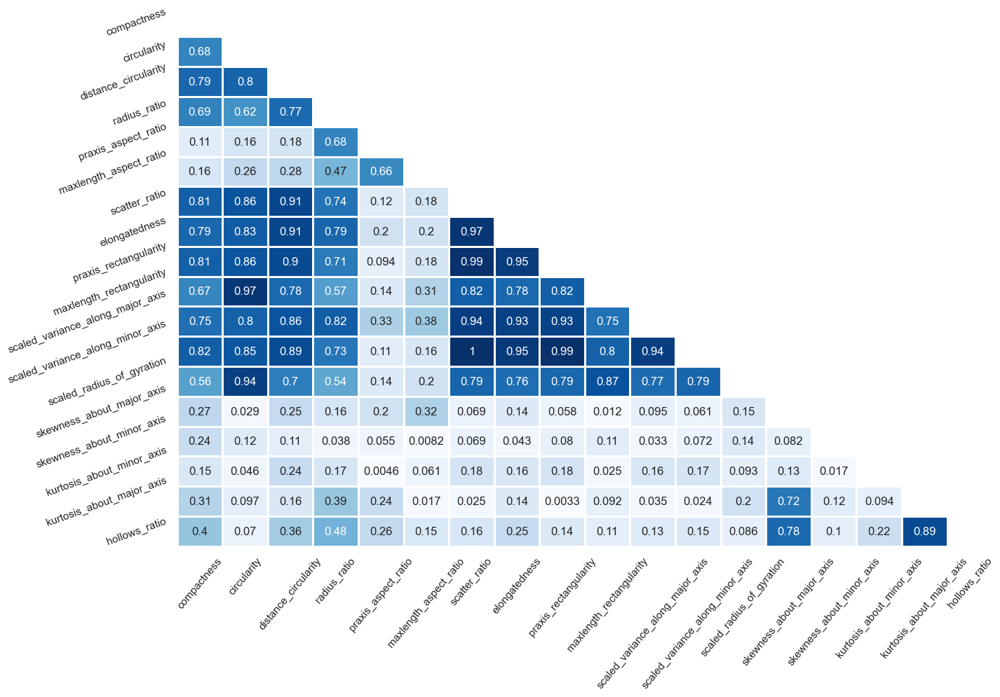

In [86]:
cor_matrix = X_train_pd.corr().abs()
lower_triangle = cor_matrix.where(np.tril(np.ones(cor_matrix.shape), k=-1).astype(bool))
plt.figure(figsize =(15,10))
sns.set_style(style='white')
sns.heatmap(lower_triangle, 
            center=0.5, cmap= 'Blues',
            annot= True, xticklabels = cor_matrix.index,
            yticklabels = cor_matrix.columns,
            cbar= False, linewidths= 1, mask =(lower_triangle==0))
plt.xticks(rotation = 50)
plt.yticks(rotation = 20) 
plt.show()

In [87]:
encoder = LabelEncoder()
X_train_pd_labeled.target = encoder.fit_transform(X_train_pd_labeled.target)
X_train_pd_labeled.drop("target", axis=1).apply(lambda x: x.corr(X_train_pd_labeled.target)).abs()

compactness                         0.000887
circularity                         0.183530
distance_circularity                0.059901
radius_ratio                        0.167280
praxis_aspect_ratio                 0.079477
maxlength_aspect_ratio              0.192385
scatter_ratio                       0.273511
elongatedness                       0.324208
praxis_rectangularity               0.242902
maxlength_rectangularity            0.063595
scaled_variance_along_major_axis    0.282977
scaled_variance_along_minor_axis    0.272616
scaled_radius_of_gyration           0.246102
skewness_about_major_axis           0.188615
skewness_about_minor_axis           0.138898
kurtosis_about_minor_axis           0.022454
kurtosis_about_major_axis           0.055248
hollows_ratio                       0.229318
dtype: float64

In [88]:
columns_to_drop = [
    "scaled_variance_along_minor_axis",
    "scaled_variance_along_major_axis",
    "kurtosis_about_minor_axis",
    "skewness_about_minor_axis",
    "scatter_ratio"
]

<font color="green">Logic</font>:

* ``scatter_ratio`` it is the inertia about axes, so it contains in its formula the information about axes, that already consist other features. Also it have a big correlation coefficient with other feature (the first assumption may be an explanation);
* ``kurtosis`` and ``skewness`` are also just a formula that contain axes information;
* ``scaled_variance_along`` have a big correlation coefficient. The same for ``scaled_variance_along_major_axis`` but the logic that we need to have some information about axes moments (that contain in the ``kurtosis`` and ``skewness`` features) and higher correlation for major axeses for this columns led me to not get rid off them. 

<font color="red">Idea</font>

Keeping in mind the distributions among classes, it is very possible that distinction between classes ``opel`` and ``saab`` will be less obvious and even maybe could not be normally separated by the linear models.

In [89]:
X_train_preprocessed = X_train_pd.drop(columns=columns_to_drop).values
X_test_preprocessed = X_test_pd.drop(columns=columns_to_drop).values
assert X_train_preprocessed.shape[-1] == X_test_preprocessed.shape[-1]

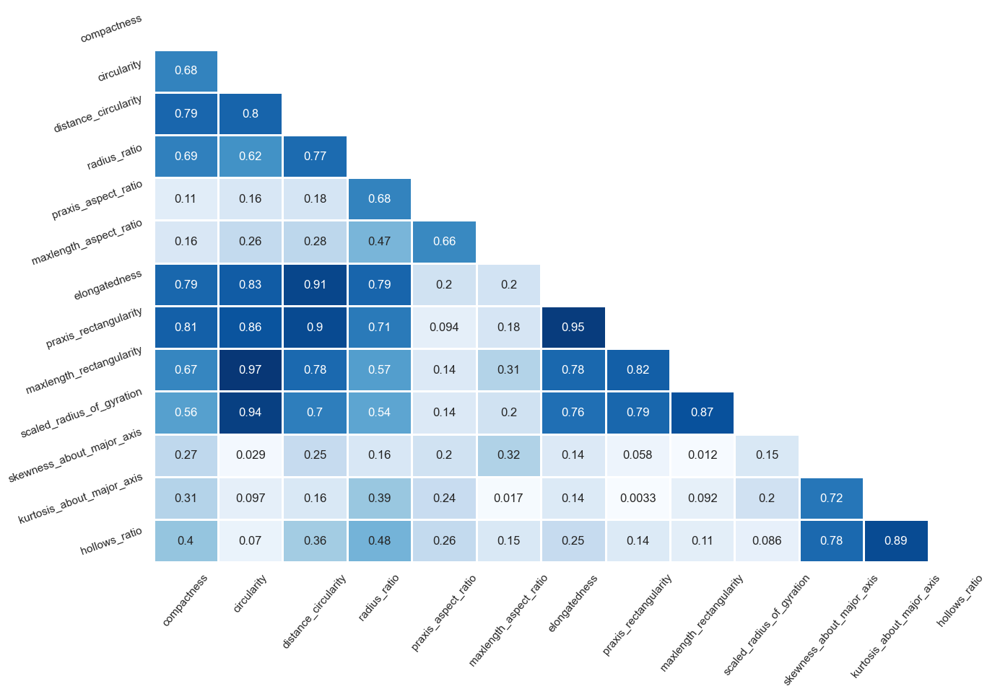

In [90]:
cor_matrix = X_train_pd.drop(columns=columns_to_drop).corr().abs()
lower_triangle = cor_matrix.where(np.tril(np.ones(cor_matrix.shape), k=-1).astype(bool))
plt.figure(figsize =(15,10))
sns.set_style(style='white')
sns.heatmap(lower_triangle, 
            center=0.5, cmap= 'Blues',
            annot= True, xticklabels = cor_matrix.index,
            yticklabels = cor_matrix.columns,
            cbar= False, linewidths= 1, mask =(lower_triangle==0))
plt.xticks(rotation = 50)
plt.yticks(rotation = 20) 
plt.show()

Encoding of labels:

In [91]:
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train_pd)
y_test = encoder.transform(y_test_pd)

#### 2.1. Basic logistic regression
* Find optimal hyperparameters for logistic regression with cross-validation on the `train` data (small grid/random search is enough, no need to find the *best* parameters).

* Estimate the model quality with `f1` and `accuracy` scores.
* Plot a ROC-curve for the trained model. For the multiclass case you might use `scikitplot` library (e.g. `scikitplot.metrics.plot_roc(test_labels, predicted_proba)`).

*Note: please, use the following hyperparameters for logistic regression: `multi_class='multinomial'`, `solver='saga'` `tol=1e-3` and ` max_iter=500`.*

In [23]:
pipe = Pipeline(
    [('scaler', StandardScaler()),
     ('regression', LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, max_iter=500))]
)

In [24]:
parameters = {'regression__C': np.linspace(5, 120, 100)}
grid = GridSearchCV(pipe, param_grid=parameters)

grid.fit(X_train_preprocessed, y_train)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('regression',
                                        LogisticRegression(max_iter=500,
                                                           multi_class='multinomial',
                                                           solver='saga',
                                                           tol=0.001))]),
             param_grid={'regression__C': array([  5.        ,   6.16161616,   7.32323232,   8.48484848,
         9.64646465,  10.80808081,  11.96969697,  13.13131313,
        14.29292929,  15.45454545,  16.61616162,  17.77777778,
        18.93939394,  20.10...
        83.98989899,  85.15151515,  86.31313131,  87.47474747,
        88.63636364,  89.7979798 ,  90.95959596,  92.12121212,
        93.28282828,  94.44444444,  95.60606061,  96.76767677,
        97.92929293,  99.09090909, 100.25252525, 101.41414141,
       102.57575758, 103.73737374, 104.8989899 , 106.06060606,
       107.22222222, 108.38383838, 109.54545455, 110.70707071,
       111.86868687, 113.03030303, 114.19191919, 115.35353535,
       116.51515152, 117.67676768, 118.83838384, 120.        ])})

In [25]:
print(f'The best hyperparameter C is {grid.best_params_["regression__C"]}')
best_logistic = grid.best_params_['regression__C']

The best hyperparameter C is 9.646464646464647


In [26]:
predicts = grid.predict(X_test_preprocessed)
print(f'f1_score = {f1_score(y_test, predicts, average="micro")}')
print(f'accuracy_score = {accuracy_score(y_test, predicts)}')

f1_score = 0.8047138047138047
accuracy_score = 0.8047138047138047


<AxesSubplot: title={'center': 'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

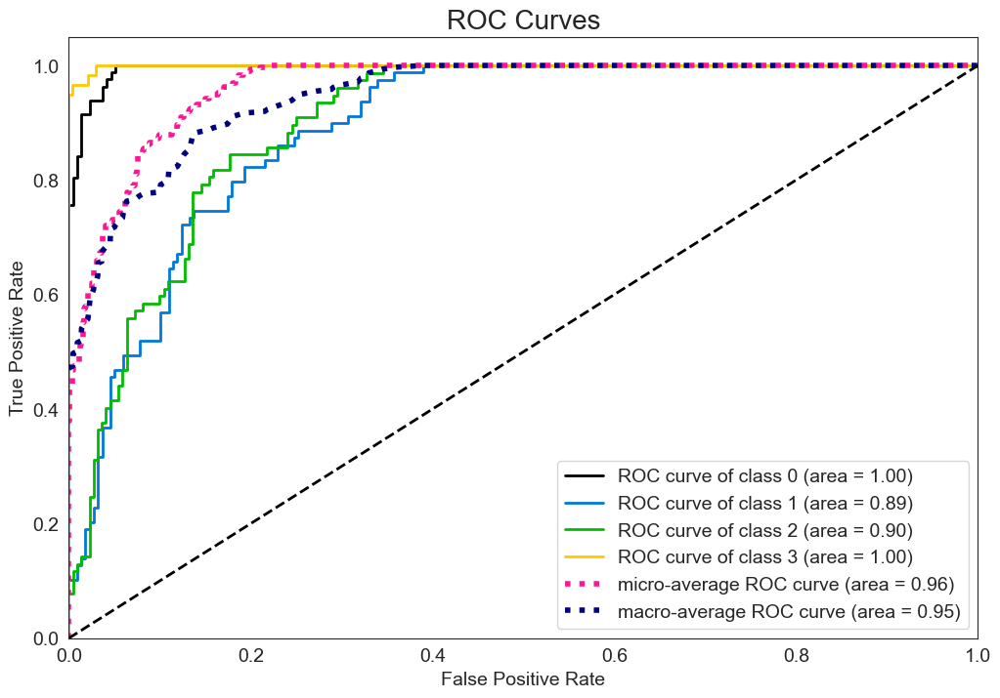

In [27]:
plot_roc(
    y_test,
    grid.predict_proba(X_test_preprocessed),
    figsize=(12, 8),
    title_fontsize=20,
    text_fontsize=14
)

In [28]:
encoder.classes_

array(['bus', 'opel', 'saab', 'van'], dtype=object)

<font color="red">Idea</font>

As I said before, the separability between ``saab`` and ``opel`` is not so obvious that is why area under their curves less than for ``van`` and ``bus``.

Let me try the recursive feature elimination strategy.

In [29]:
X_train = X_train_pd.values
y_train.shape, X_train.shape

((549,), (549, 18))

In [30]:
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score

In [36]:
from sklearn.base import BaseEstimator
import warnings
warnings.filterwarnings("ignore")
def rfecv_process(clf: BaseEstimator,
                  X_train: Iterable,
                  y_train: Iterable,
                  norm: bool=True):
    '''
    Function that takes classifier and data, making pipeline,
    using cross-validation to find the best hyperparameters,
    plot the graph of accuracy score depended on count of reduced features 
    and return rfecv object.
    '''
    rfecv = RFECV(estimator=clf)
    if norm:
        pipe = make_pipeline(
            rfecv,
            StandardScaler(),
            clf)
    else:
        pipe = make_pipeline(
            rfecv,
            clf)
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=36851234)
    n_scores = cross_val_score(pipe, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1)
    print(f"Mean score through cross-validation = {np.mean(n_scores)}")
    pipe.fit(X_train, y_train)
    rfecv.n_features_
    plt.figure(figsize=(12,6))
    sns.set()
    plt.title("Recursive feature elimination", fontsize=24)
    plt.xlabel("Number of features selected", fontsize=16)
    plt.ylabel("Cross validation score (nb of correct classifications)", fontsize=16)
    plt.plot(range(1, 
            len(rfecv.cv_results_['mean_test_score']) + 1), 
            rfecv.cv_results_['mean_test_score'])

    plt.show()
    return rfecv

Mean score through cross-validation = 0.7512592592592591


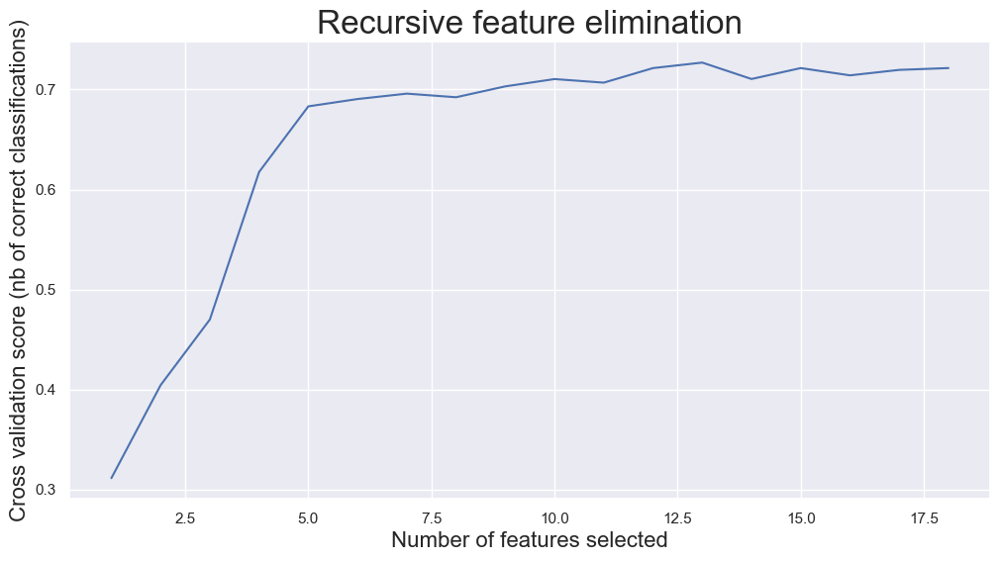

In [37]:
rfecv = rfecv_process(
    LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, max_iter=500),
    X_train, y_train)

In [41]:
rfecv_df = pd.DataFrame(rfecv.ranking_, index=X_train_pd.columns, columns=['Rank']).sort_values(by='Rank',ascending=True)
to_drop = rfecv_df[rfecv_df['Rank'] > 1].index.values
rfecv_df

,Rank
compactness,1
skewness_about_minor_axis,1
scaled_variance_along_major_axis,1
maxlength_rectangularity,1
kurtosis_about_major_axis,1
elongatedness,1
hollows_ratio,1
maxlength_aspect_ratio,1
praxis_aspect_ratio,1
radius_ratio,1


In [42]:
def plot_cor_matrix(X_train_pd: pd.DataFrame,
                    to_drop: list):
    '''
    Function for pretty plotting lower triangle of correlation matrix (absolute values)
    '''
    cor_matrix = X_train_pd.drop(columns=to_drop).corr().abs()
    lower_triangle = cor_matrix.where(np.tril(np.ones(cor_matrix.shape), k=-1).astype(bool))
    plt.figure(figsize =(15,10))
    sns.set_style(style='white')
    sns.heatmap(lower_triangle, 
                center=0.5, cmap= 'Blues',
                annot= True, xticklabels = cor_matrix.index,
                yticklabels = cor_matrix.columns,
                cbar= False, linewidths= 1, mask =(lower_triangle==0))
    plt.xticks(rotation = 50)
    plt.yticks(rotation = 20) 
    plt.show()

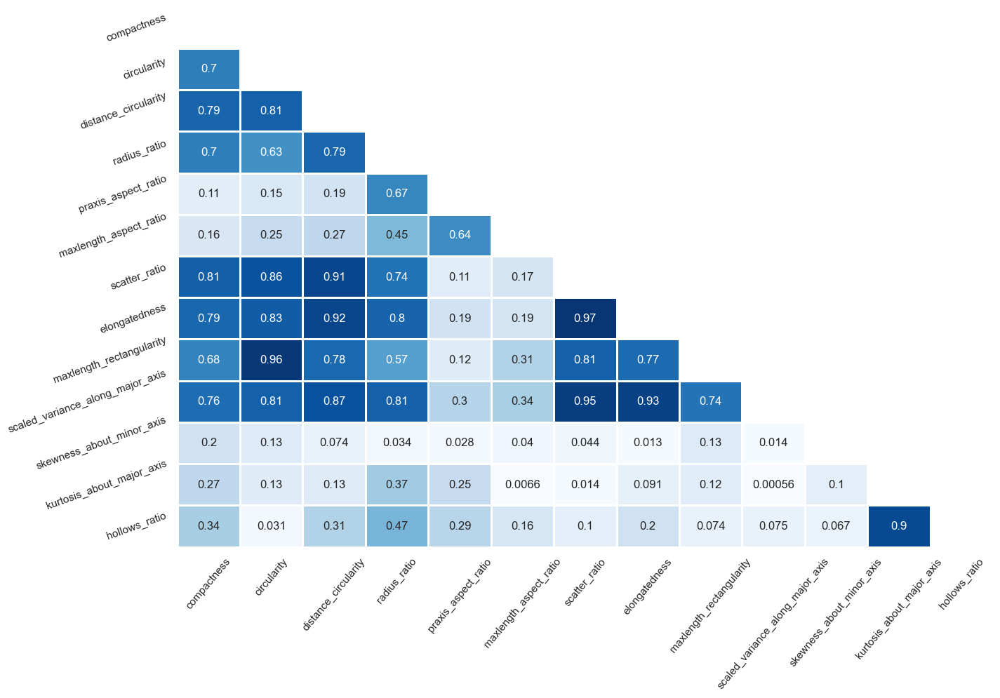

In [43]:
plot_cor_matrix(X_train_pd, to_drop)

In [44]:
X_train_rfe = X_train_pd.drop(columns=to_drop).values
X_test_rfe = X_test_pd.drop(columns=to_drop).values
assert X_train_rfe.shape[-1] == X_test_rfe.shape[-1]

In [47]:
pipe = Pipeline(
    [('scaler', StandardScaler()),
     ('regression', LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, max_iter=500))]
)
parameters = {'regression__C': np.linspace(5, 120, 100)}
grid = GridSearchCV(pipe, param_grid=parameters)

grid.fit(X_train_rfe, y_train)

predicts = grid.predict(X_test_rfe)
print(f'f1_score = {f1_score(y_test, predicts, average="macro")}')
print(f'accuracy_score = {accuracy_score(y_test, predicts)}')

f1_score = 0.8038311359902495
accuracy_score = 0.8013468013468014


<AxesSubplot: title={'center': 'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

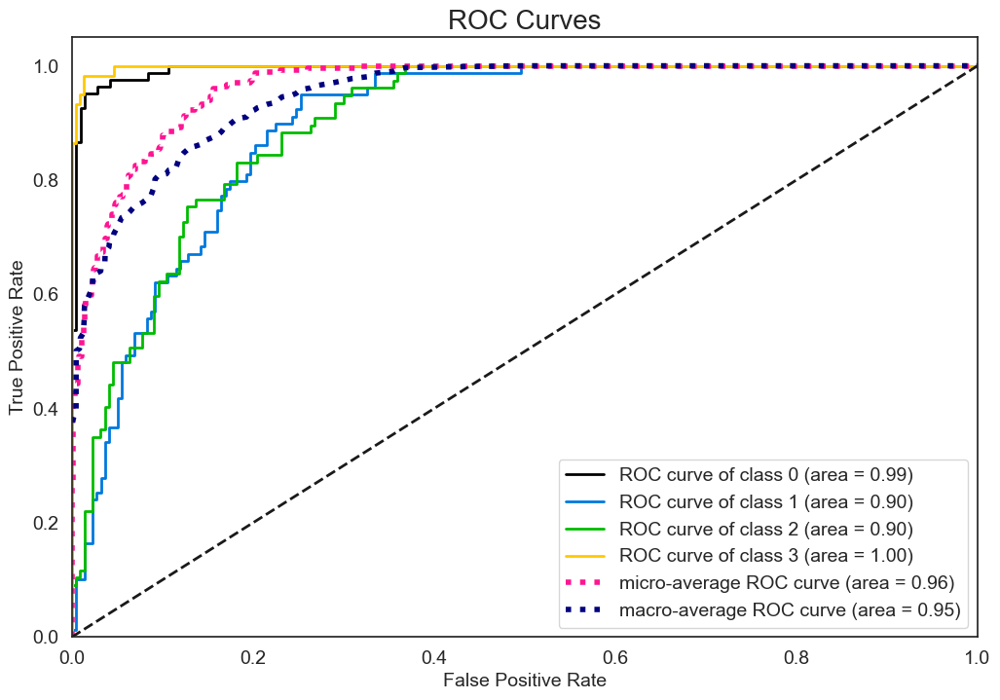

In [48]:
plot_roc(
    y_test,
    grid.predict_proba(X_test_rfe),
    figsize=(12, 8),
    title_fontsize=20,
    text_fontsize=14
)

<font color="green">Ideas</font>

* These columns to drop are harder to be interpreted, but results are similar;
* Maybe the knowledge about moments of axeses may be useful due to the nonlinear nature;
* However, worth noting, that ``opel`` and ``saab`` separated a little worse. The thoughts about similarity of distribution maybe useful either.

In [44]:
# You might use this command to install scikit-plot. 
# Warning, if you a running locally, don't call pip from within jupyter, call it from terminal in the corresponding 
# virtual environment instead

# ! pip install scikit-plot

#### 2.2. PCA: explained variance plot
* Apply the PCA to the train part of the data. Build the explaided variance plot. 

In [92]:
pipe = make_pipeline(StandardScaler(), PCA())
pipe.fit(X_train_preprocessed)
pipe['pca'].explained_variance_ratio_.cumsum() * 100

array([ 51.64533411,  73.6296812 ,  87.94932147,  91.70279763,
        94.86398332,  96.92162309,  97.99577207,  98.72784707,
        99.18930254,  99.52222869,  99.75937816,  99.90596121,
       100.        ])

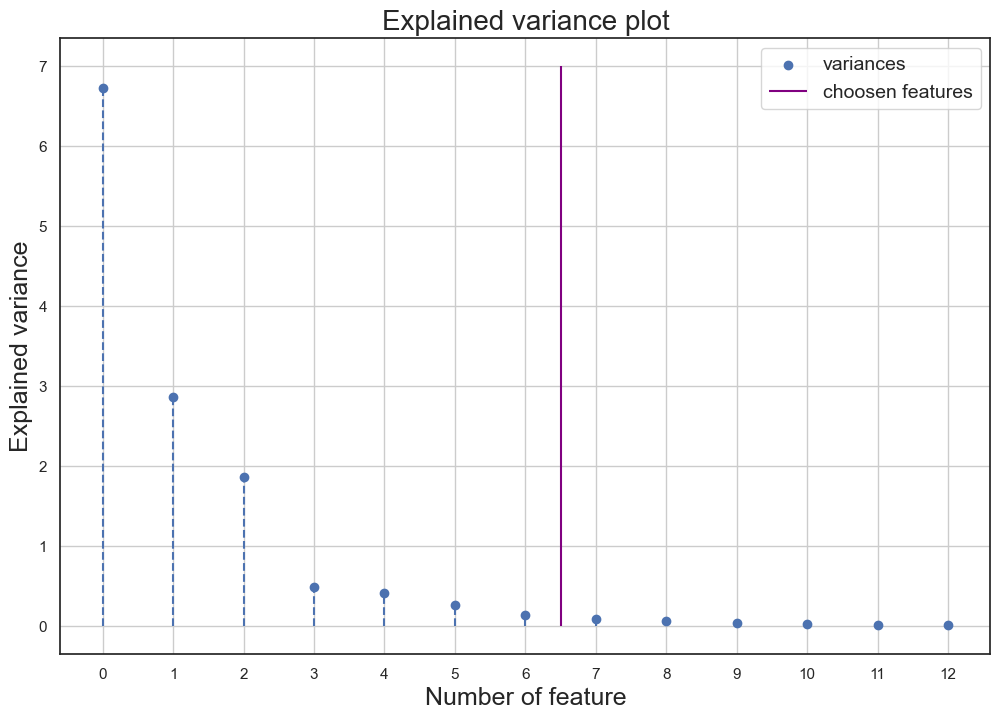

In [93]:
bins = np.arange(0, pipe['pca'].n_components_)

plt.figure(figsize=(12, 8))
plt.scatter(bins, pipe['pca'].explained_variance_, label='variances')
plt.title('Explained variance plot', fontsize=20)

plt.xlabel('Number of feature', fontsize=18)
plt.ylabel('Explained variance', fontsize=18)
plt.xticks(bins)

plt.vlines(bins, np.zeros(len(bins)), pipe['pca'].explained_variance_, linestyles='--')
plt.vlines(6.5, 0, 7, color='purple', label='choosen features')
plt.legend(fontsize=14)

plt.grid(True)
plt.show()

#### 2.3. PCA trasformation
* Select the appropriate number of components. Briefly explain your choice. Should you normalize the data?

*Use `fit` and `transform` methods to transform the `train` and `test` parts.*

**Note: From this point `sklearn` [Pipeline](https://scikit-learn.org/stable/modules/compose.html) might be useful to perform transformations on the data. Refer to the [docs](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) for more information.**

In [51]:
X_train_pd.describe()

,compactness,circularity,distance_circularity,radius_ratio,praxis_aspect_ratio,maxlength_aspect_ratio,scatter_ratio,elongatedness,praxis_rectangularity,maxlength_rectangularity,scaled_variance_along_major_axis,scaled_variance_along_minor_axis,scaled_radius_of_gyration,skewness_about_major_axis,skewness_about_minor_axis,kurtosis_about_minor_axis,kurtosis_about_major_axis,hollows_ratio
count,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000,549.000000
mean,93.548270,44.714026,81.566485,167.524590,61.426230,8.497268,168.025501,41.202186,20.533698,147.721311,187.965392,435.989071,174.276867,72.699454,6.373406,12.553734,188.797814,195.473588
std,8.067232,6.115390,16.093637,33.398362,7.634949,4.583222,33.645740,7.959817,2.625196,14.409696,32.210257,178.517179,32.252141,7.750607,4.925068,8.739296,6.276267,7.559842
min,76.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,112.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,140.000000,57.000000,6.000000,144.000000,33.000000,19.000000,137.000000,166.000000,311.000000,150.000000,68.000000,2.000000,5.000000,184.000000,190.000000
50%,93.000000,44.000000,78.000000,165.000000,61.000000,8.000000,156.000000,43.000000,20.000000,145.000000,177.000000,360.000000,173.000000,72.000000,6.000000,11.000000,188.000000,196.000000
75%,100.000000,49.000000,98.000000,194.000000,65.000000,10.000000,200.000000,46.000000,23.000000,159.000000,217.000000,600.000000,197.000000,76.000000,9.000000,19.000000,193.000000,201.000000
max,115.000000,58.000000,110.000000,333.000000,138.000000,55.000000,261.000000,61.000000,28.000000,188.000000,320.000000,998.000000,264.000000,135.000000,22.000000,39.000000,206.000000,211.000000


Standard deviation varied between features. That is why we need to normalize data. Let me apply ``StandardScaler`` for this purpose.

In [100]:
pca = PCA(n_components=7)
scaler = StandardScaler()

X_train_normalized = scaler.fit_transform(X_train_preprocessed)
X_test_normalized = scaler.transform(X_test_preprocessed)

X_train_reduced = pca.fit_transform(X_train_normalized)
X_test_reduced = pca.transform(X_test_normalized)

pca.explained_variance_ratio_.sum() * 100

97.99577206554434

Eight features in case of they cumulatively give us the ``98`` percent of variance.

In [101]:
best_pca = 7

#### 2.4. Logistic regression on PCA-preprocessed data.
* Find optimal hyperparameters for logistic regression with cross-validation on the transformed by PCA `train` data.

* Estimate the model quality with `f1` and `accuracy` scores.
* Plot a ROC-curve for the trained model. For the multiclass case you might use `scikitplot` library (e.g. `scikitplot.metrics.plot_roc(test_labels, predicted_proba)`).

*Note: please, use the following hyperparameters for logistic regression: `multi_class='multinomial'`, `solver='saga'` and `tol=1e-3`*

In [102]:
pipe = make_pipeline(
    StandardScaler(),
    PCA(n_components=best_pca),
    LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, max_iter=1000)
)

bins = {'logisticregression__C': np.linspace(0.01, 10, 100)}
grid = GridSearchCV(pipe, param_grid=bins)
grid.fit(X_train_preprocessed, y_train)

GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('pca', PCA(n_components=7)),
                                       ('logisticregression',
                                        LogisticRegression(max_iter=1000,
                                                           multi_class='multinomial',
                                                           solver='saga',
                                                           tol=0.001))]),
             param_grid={'logisticregression__C': array([ 0.01      ,  0.11090909,  0.21181818,  0.31272727,  0.41363636,
        0.51454545,  0.61545455,  0.71636364,  0.81727273,  0....
        6.56909091,  6.67      ,  6.77090909,  6.87181818,  6.97272727,
        7.07363636,  7.17454545,  7.27545455,  7.37636364,  7.47727273,
        7.57818182,  7.67909091,  7.78      ,  7.88090909,  7.98181818,
        8.08272727,  8.18363636,  8.28454545,  8.38545455,  8.48636364,
        8.58727273,  8.68818182,  8.78909091,  8.89      ,  8.99090909,
        9.09181818,  9.19272727,  9.29363636,  9.39454545,  9.49545455,
        9.59636364,  9.69727273,  9.79818182,  9.89909091, 10.        ])})

In [103]:
best_logistic = grid.best_params_['logisticregression__C']
print(f'Best logistic regression hyperparameter: {best_logistic}')

Best logistic regression hyperparameter: 1.4227272727272726


In [104]:
predicts = grid.predict(X_test_preprocessed)

print(f"f1_score = {f1_score(y_test, predicts, average='macro')}")
print(f'accuracy_score = {accuracy_score(y_test, predicts)}')

f1_score = 0.6931818181818182
accuracy_score = 0.7003367003367004


<AxesSubplot: title={'center': 'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

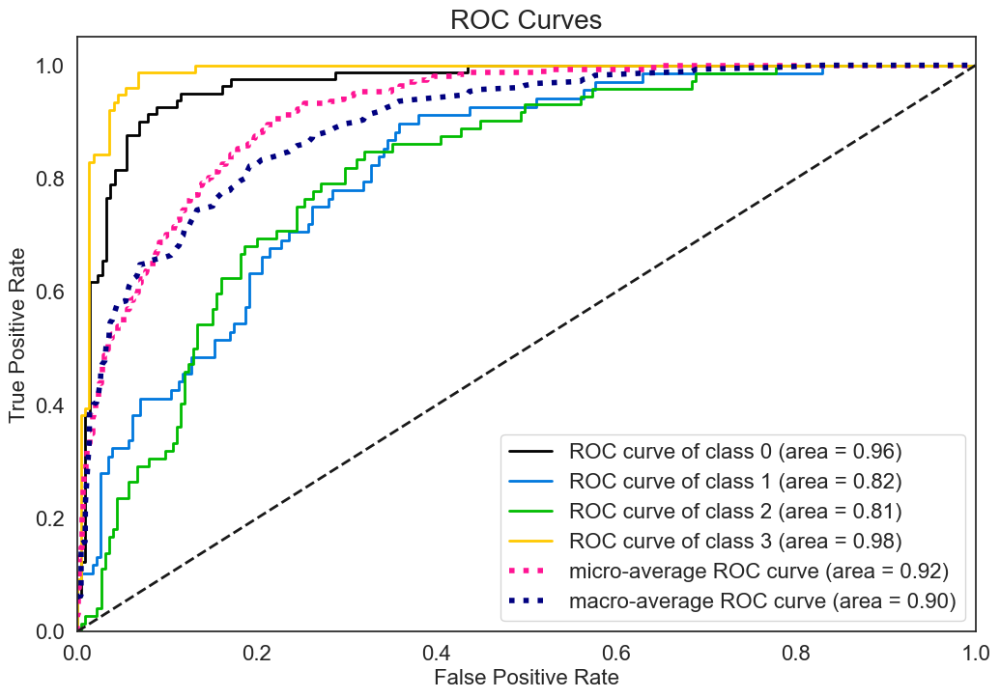

In [105]:
plot_roc(
    y_test,
    grid.predict_proba(X_test_preprocessed),
    figsize=(12, 8),
    title_fontsize=20,
    text_fontsize=16
)

#### 2.5. Decision tree
* Now train a desicion tree on the same data. Find optimal tree depth (`max_depth`) using cross-validation.

* Measure the model quality using the same metrics you used above.

In [58]:
from sklearn.tree import DecisionTreeClassifier

pipe = make_pipeline(
    DecisionTreeClassifier()
)

param_grid = {
    "decisiontreeclassifier__max_depth": np.arange(2, 25)
}

grid = GridSearchCV(pipe, param_grid=param_grid)

grid.fit(X_train_preprocessed, y_train)
best_depth = grid.best_params_["decisiontreeclassifier__max_depth"]
print(f"The best max_depth for decision tree: {best_depth}")

The best max_depth for decision tree: 8


In [60]:
predicts = grid.predict(X_test_preprocessed)

print(f"f1_score = {f1_score(y_test, predicts, average='macro')}")
print(f"accuracy_score = {accuracy_score(y_test, predicts)}")

f1_score = 0.7293373728478258
accuracy_score = 0.7306397306397306


Mean score through cross-validation = 0.6834612794612792


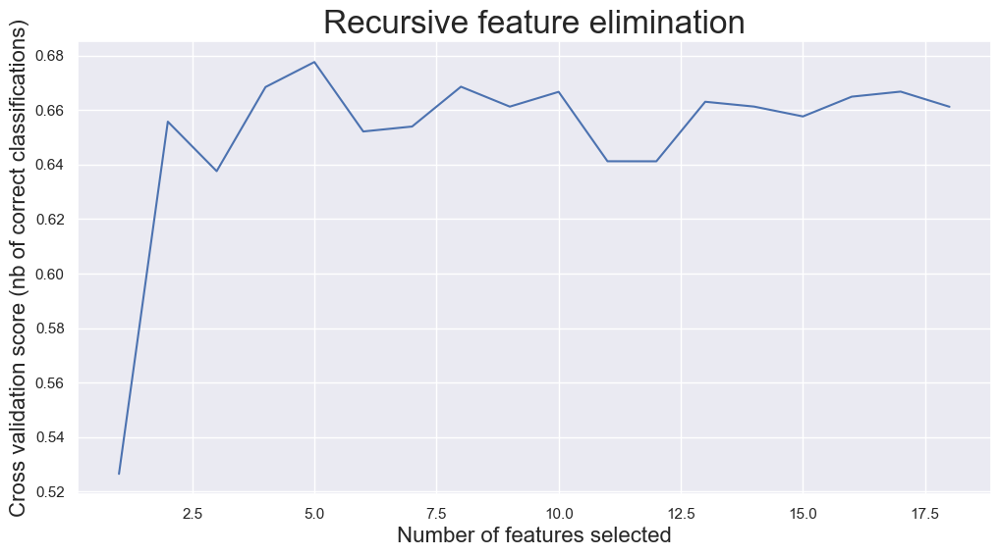

In [61]:
rfecv = rfecv_process(
    DecisionTreeClassifier(max_depth=best_depth),
    X_train, y_train)

In [62]:
rfecv_df = pd.DataFrame(rfecv.ranking_,index=X_train_pd.columns, columns=['Rank']).sort_values(by='Rank',ascending=True)
to_drop = rfecv_df[rfecv_df['Rank'] > 1].index.values
rfecv_df

,Rank
scaled_variance_along_minor_axis,1
maxlength_rectangularity,1
praxis_aspect_ratio,1
maxlength_aspect_ratio,1
elongatedness,1
compactness,2
distance_circularity,3
hollows_ratio,4
circularity,5
skewness_about_minor_axis,6


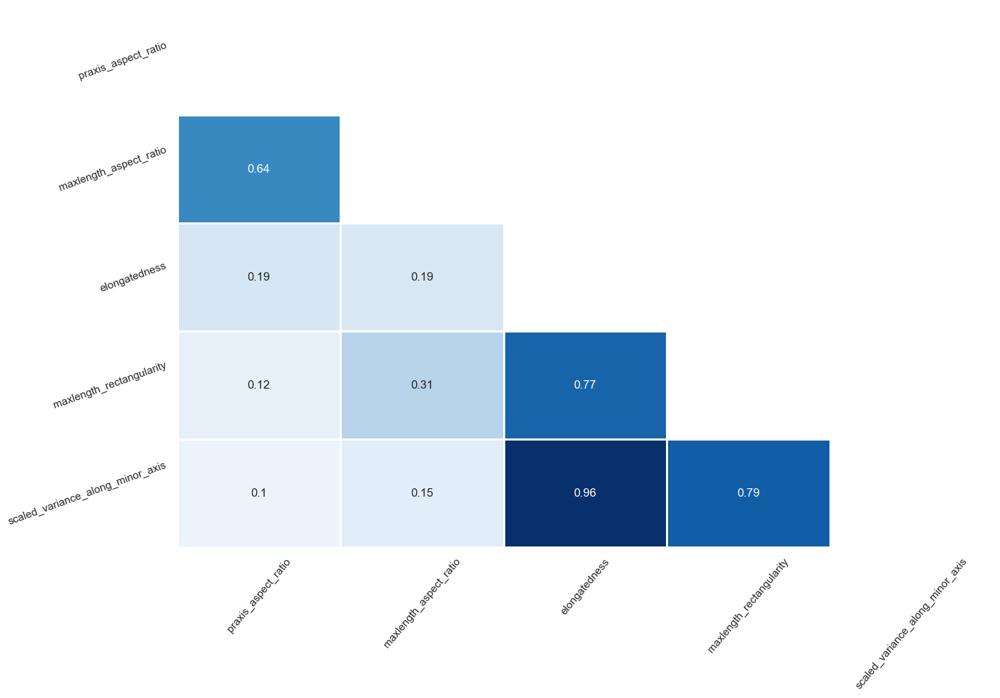

In [63]:
plot_cor_matrix(X_train_pd, to_drop)

In [64]:
X_train_rfe = X_train_pd.drop(columns=to_drop).values
X_test_rfe = X_test_pd.drop(columns=to_drop).values
assert X_train_rfe.shape[-1] == X_test_rfe.shape[-1]

In [65]:
pipe = make_pipeline(
    DecisionTreeClassifier()
)

param_grid = {
    "decisiontreeclassifier__max_depth": np.arange(2, 25)
}

grid = GridSearchCV(pipe, param_grid=param_grid)

grid.fit(X_train_rfe, y_train)
print(f"The best max_depth for decision tree: {grid.best_params_['decisiontreeclassifier__max_depth']}")
predicts = grid.predict(X_test_rfe)

print(f"f1_score = {f1_score(y_test, predicts, average='macro')}")
print(f"accuracy_score = {accuracy_score(y_test, predicts)}")

The best max_depth for decision tree: 21
f1_score = 0.6706041261054749
accuracy_score = 0.6632996632996633


#### 2.6. Bagging.
Here starts the ensembling part.

First we will use the __Bagging__ approach. Build an ensemble of $N$ algorithms varying N from $N_{min}=2$ to $N_{max}=100$ (with step 5).

We will build two ensembles: of logistic regressions and of decision trees.

*Comment: each ensemble should be constructed from models of the same family, so logistic regressions should not be mixed up with decision trees.*


*Hint 1: To build a __Bagging__ ensebmle varying the ensemble size efficiently you might generate $N_{max}$ subsets of `train` data (of the same size as the original dataset) using bootstrap procedure once. Then you train a new instance of logistic regression/decision tree with optimal hyperparameters you estimated before on each subset (so you train it from scratch). Finally, to get an ensemble of $N$ models you average the $N$ out of $N_{max}$ models predictions.*

*Hint 2: sklearn might help you with this taks. Some appropriate function/class might be out there.*

* Plot `f1` and `accuracy` scores plots w.r.t. the size of the ensemble.

* Briefly analyse the plot. What is the optimal number of algorithms? Explain your answer.

* How do you think, are the hyperparameters for the decision trees you found in 2.5 optimal for trees used in ensemble? 

In [106]:
from sklearn.ensemble import BaggingClassifier
ESTIMATORS_COUNT = np.arange(2, 100, 5)

def bagging_metrics(clf: BaseEstimator,
                    X_train: Iterable,
                    y_train: Iterable, 
                    X_test: Iterable, 
                    y_test: Iterable, 
                    norm: bool=True) -> tuple:
    '''
    It is the function for usage bagging and taking statistics from it.
    Takes train and test data, classifier, makes some preprocessing stuff if needed,
    and return f1 and accuracies scores depends of estimators for bagging counts.
    '''
    if norm:
        pipe = make_pipeline(
            StandardScaler(),
            PCA(n_components=best_pca),
            clf
        )
    else:
        pipe = make_pipeline(clf)

    f1_scores, accuracy_scores = [], []

    for est_count in ESTIMATORS_COUNT:
        bclf = BaggingClassifier(pipe, n_estimators=est_count, random_state=0xDEAD)

        bclf.fit(X_train, y_train)

        preds = bclf.predict(X_test)
        f1_scores.append(f1_score(y_test, preds, average="macro"))
        accuracy_scores.append(accuracy_score(y_test, preds))
        
    return f1_scores, accuracy_scores

In [107]:
def plot_score(f1: Iterable, 
              accuracy: Iterable, 
              title: str) -> None:
    '''
    Pretty plotting of metrics depends of counts of estimators for bagging.
    '''
    plt.figure(figsize=(12, 8))
    sns.set()
    plt.plot(ESTIMATORS_COUNT, f1, label='f1 score')
    plt.plot(ESTIMATORS_COUNT, accuracy, label='accuracy score')

    plt.title(title, fontsize=20)

    plt.xlabel('Number of estimators', fontsize=18)
    plt.ylabel('Score', fontsize=18)

    plt.legend(fontsize=16)

    plt.xticks(ESTIMATORS_COUNT)
    plt.grid(True)
    plt.show()

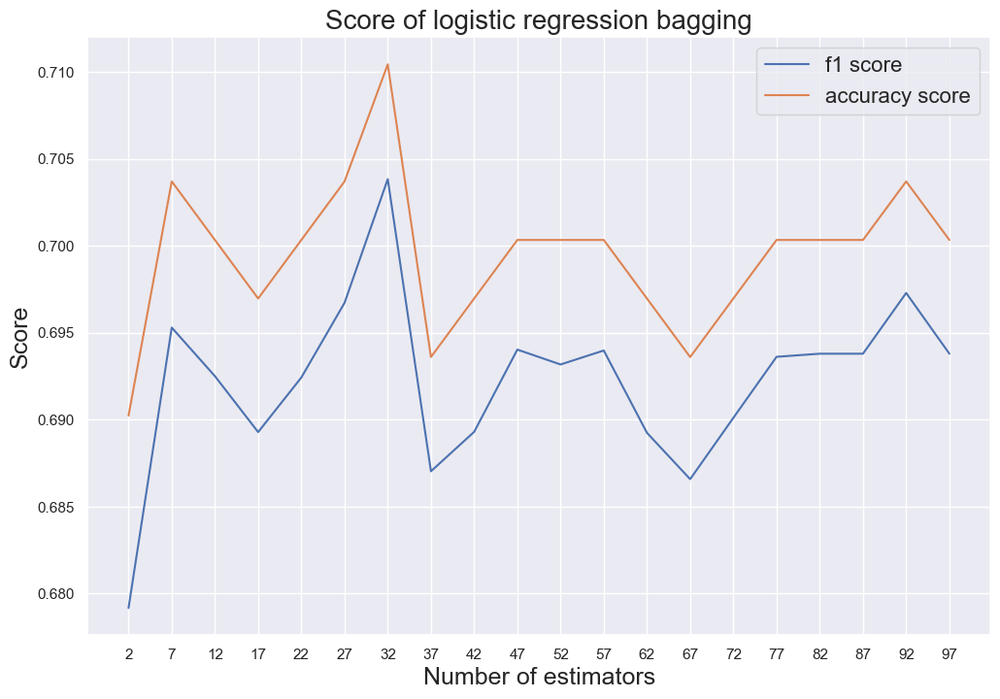

In [109]:
f1_logistic, accuracy_logistic = bagging_metrics(
    LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, C=best_logistic, max_iter=1000),
    X_train=X_train_preprocessed,
    y_train=y_train,
    X_test=X_test_preprocessed,
    y_test=y_test,
    norm=True
)

plot_score(f1_logistic, accuracy_logistic, 'Score of logistic regression bagging')

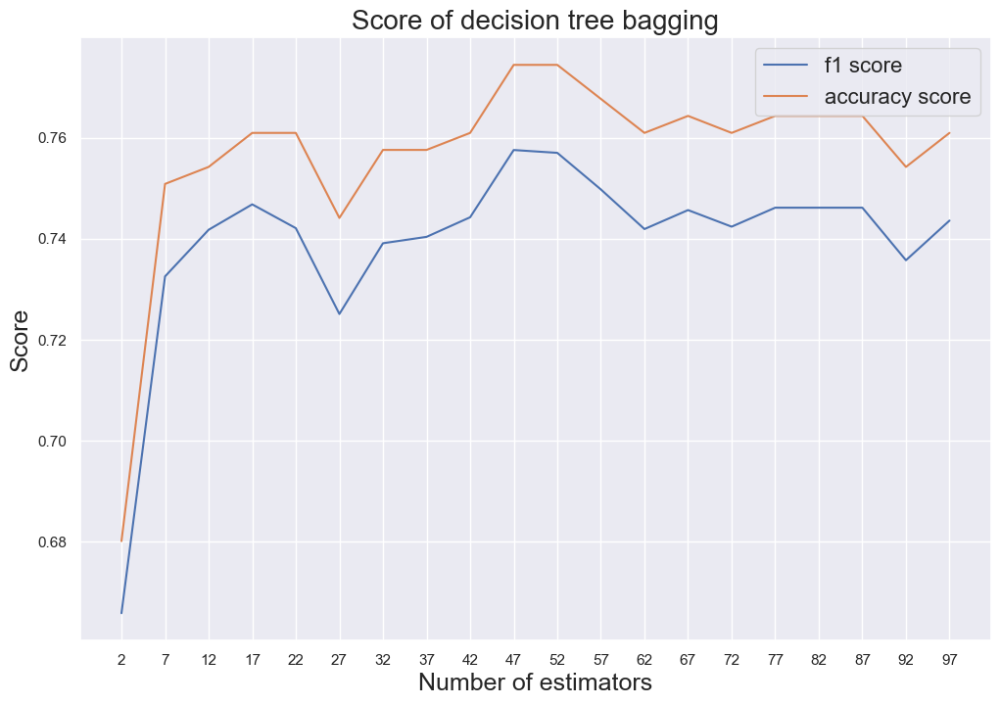

In [110]:
f1_dt, accuracy_dt = bagging_metrics(
    DecisionTreeClassifier(max_depth=best_depth),
    X_train=X_train_preprocessed,
    y_train=y_train,
    X_test=X_test_preprocessed,
    y_test=y_test,
    norm=False
)

plot_score(f1_dt, accuracy_dt, 'Score of decision tree bagging')

Inferences:

* Keeping in mind that bagging is using for decreasing variance, I can assume that bagging does not work for logistic regression because of its own small variance. We can see it following the graphs.

* From the other hand, bagging is very useful for decision trees, because of higher level of variance for this type of variance.

* That is why for logistic regression it is enough to get only one model. In the same time in case of decision trees it is quite optimal to have approximately 50 estimators.

#### 2.7. Random Forest
Now we will work with the Random Forest (its `sklearn` implementation).

* * Plot `f1` and `accuracy` scores plots w.r.t. the number of trees in Random Forest.

* What is the optimal number of trees you've got? Is it different from the optimal number of logistic regressions/decision trees in 2.6? Explain the results briefly.

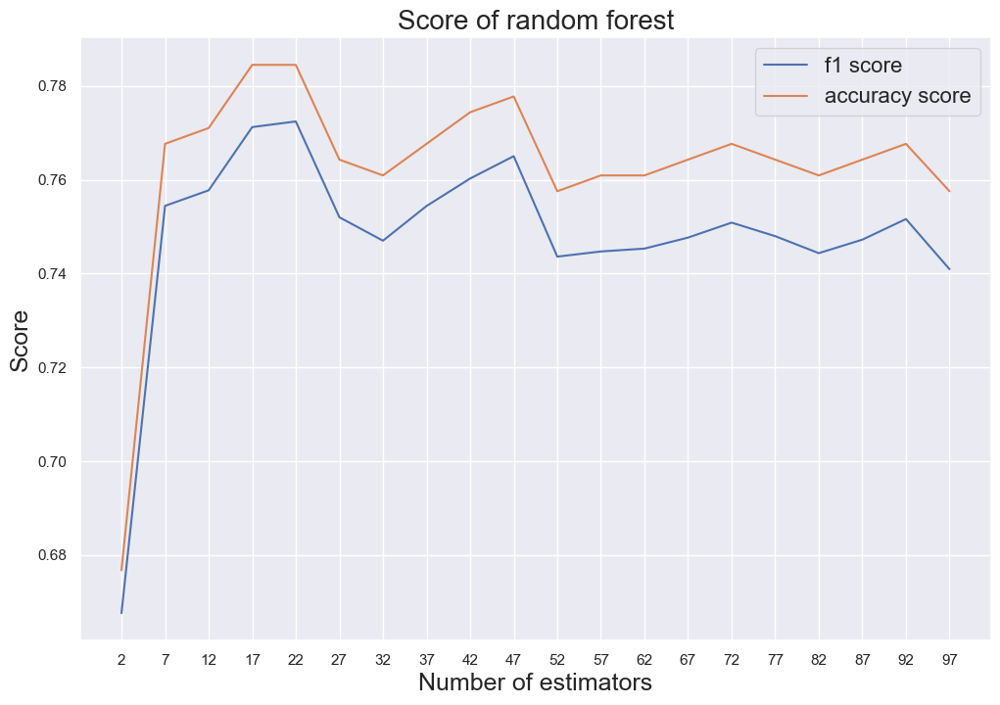

In [114]:
from sklearn.ensemble import RandomForestClassifier

f1_rf = []
accuracy_rf = []
for count in ESTIMATORS_COUNT:
    forest = RandomForestClassifier(n_estimators=count, random_state=42)
    forest.fit(X_train_preprocessed, y_train)
    predicts = forest.predict(X_test_preprocessed)
    f1_rf.append(f1_score(y_test, predicts, average='macro'))
    accuracy_rf.append(accuracy_score(y_test, predicts))
    
plot_score(f1_rf, accuracy_rf, 'Score of random forest')

The optimal number of trees is approximately equal to 20. It is lesser than in case of bagging due to the less variance in Random forest.

#### 2.8. Learning curve
Your goal is to estimate, how does the model behaviour change with the increase of the `train` dataset size.

* Split the training data into 10 equal (almost) parts. Then train the models from above (Logistic regression, Desicion Tree, Random Forest) with optimal hyperparameters you have selected on 1 part, 2 parts (combined, so the train size in increased by 2 times), 3 parts and so on.

* Build a plot of `accuracy` and `f1` scores on `test` part, varying the `train` dataset size (so the axes will be score - dataset size.

* Analyse the final plot. Can you make any conlusions using it? 

In [115]:
def plot_score_train_size(sizes: Iterable,
                          f1: Iterable, 
                          accuracy: Iterable, 
                          title: str):
    '''
    Pretty plotting metrics depends on train data size
    '''
    plt.figure(figsize=(12, 8))
    sns.set()
    plt.plot(sizes, f1, label='f1 score')
    plt.plot(sizes, accuracy, label='accuracy score')
    plt.title(title, fontsize=20)
    
    plt.xlabel('Training data size', fontsize=18)
    plt.ylabel('Score', fontsize=18)
    
    plt.legend(fontsize=16)

    plt.xticks(sizes)
    plt.grid(True)
    plt.show()

In [116]:
step = np.round(X_train_preprocessed.shape[0] / 10)
sizes = np.arange(step, X_train_preprocessed.shape[0], step, dtype=int)
sizes = np.append(sizes, X_train_preprocessed.shape[0])

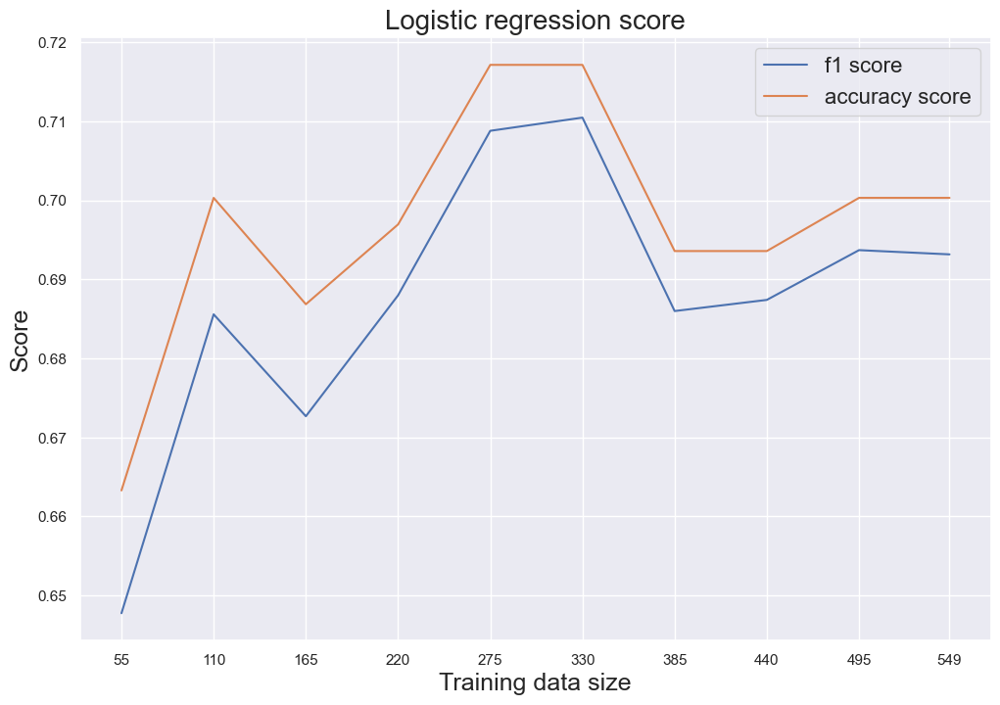

In [119]:
f1 = []
accuracy = []

for size in sizes:
    
    pipe = make_pipeline(
        StandardScaler(),
        PCA(n_components=best_pca),
        LogisticRegression(multi_class='multinomial', solver='saga', tol=1e-3, C=best_logistic, max_iter=1000)
    )
    
    pipe.fit(X_train_preprocessed[:size], y_train[:size])
    predicts = pipe.predict(X_test_preprocessed)
    f1.append(f1_score(y_test, predicts, average='macro'))
    accuracy.append(accuracy_score(y_test, predicts))

plot_score_train_size(sizes, f1, accuracy, 'Logistic regression score')

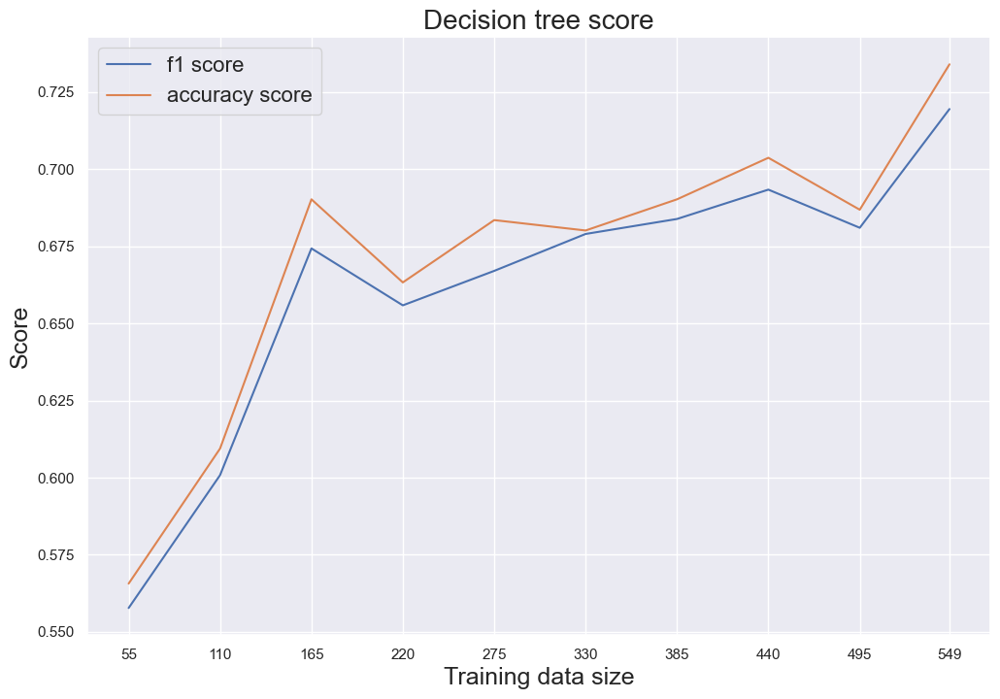

In [121]:
f1 = []
accuracy = []

for size in sizes:
    pipe = make_pipeline(
        DecisionTreeClassifier(max_depth=best_depth)
    )
    pipe.fit(X_train_preprocessed[:size], y_train[:size])
    predicts = pipe.predict(X_test_preprocessed)
    f1.append(f1_score(y_test, predicts, average='macro'))
    accuracy.append(accuracy_score(y_test, predicts))
    
plot_score_train_size(sizes, f1, accuracy, 'Decision tree score')

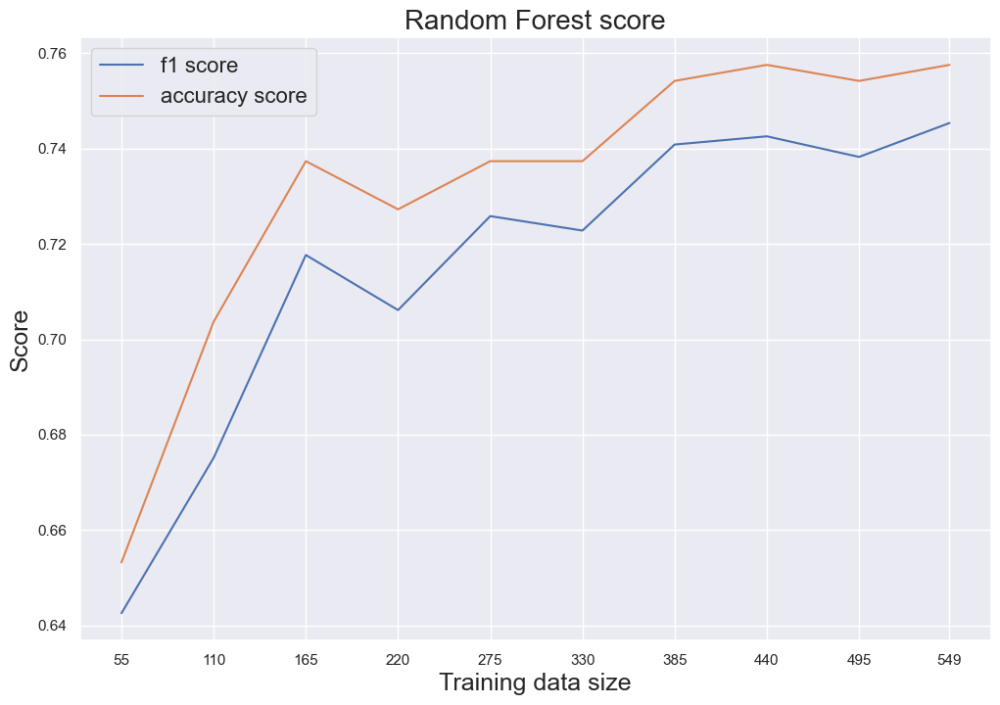

In [125]:
f1 = []
accuracy = []

for size in sizes:
    pipe = make_pipeline(
        RandomForestClassifier(n_estimators=20)
    )
    pipe.fit(X_train_preprocessed[:size], y_train[:size])
    predicts = pipe.predict(X_test_preprocessed)
    f1.append(f1_score(y_test, predicts, average='macro'))
    accuracy.append(accuracy_score(y_test, predicts))
    
plot_score_train_size(sizes, f1, accuracy, 'Random Forest score')

The graphs show that, unlike Random forest and Decision trees, logistic regression does not require a huge sample size due to the low variance.